In [ ]:
from google.colab import drive
drive.mount('/content/drive')
# !pip install pytorch_toolbelt

Mounted at /content/drive


In [ ]:
import os
import numpy as np
import torch
import glob
from scipy.io import loadmat
from torch.utils.data import Dataset
from skimage.exposure import rescale_intensity


class OrganSegmentationDataset(Dataset):

  def __init__(
        self,
        # images_dir="/content/drive/MyDrive/Research/Image_segmentation/processed_data",
        images_dir="/content/drive/MyDrive/dataset/processed_data",
        subset="train",
        traning_patient = 35,
        test_length = 5,
    ):
    self.images_dir = images_dir
    self.subset = subset
    self.traning_patient = traning_patient
    self.data_paths = []
    self.patient_ids = []
    self.required_test = False
    assert subset in ["all", "train", "validation"]

    print("reading {} images...".format(subset))
    filesPath = glob.glob(images_dir+"/*.mat")
    if(subset == "train"):
      for filePath in sorted(filesPath):
        patient_id = int(filePath.split("/")[-1].split("_")[1])
        if patient_id <= traning_patient:
          if patient_id not in self.patient_ids:
            self.patient_ids.append(patient_id)
          self.data_paths.append(filePath)
          self.data_paths = sorted(self.data_paths)
    
    elif (subset == "validation"):
      filesPath = (filesPath)
      for filePath in sorted(filesPath):
        patient_id = int(filePath.split("/")[-1].split("_")[1])
        if traning_patient+test_length >= patient_id > traning_patient:
          if patient_id not in self.patient_ids:
            self.patient_ids.append(patient_id)
          self.data_paths.append(filePath)
          self.data_paths = sorted(self.data_paths)
    print(self.patient_ids)
  
  def __len__(self):
    return len(self.data_paths)

  def __getitem__(self, id):
    filePath = self.data_paths[id] 
    file_name = filePath.split("/")[-1].split("_")
    patient_id = int(file_name[1])
    slice_id = int(file_name[3].split(".")[0])
    mat = loadmat(filePath)
    mask = mat['seg_img']
    image = mat['main_img']

    #expand dimention
    image = np.expand_dims(image, axis = 2)
    
    #change shape (C, H, W)
    image = image.transpose(2, 0, 1)

    image_tensor = torch.from_numpy(image.astype(np.float32))
    mask_tensor = torch.from_numpy(mask.astype(int))


    return image_tensor, mask_tensor, patient_id, slice_id

In [ ]:
from collections import OrderedDict

import torch
import torch.nn as nn


class UNet(nn.Module):

    def __init__(self, in_channels=3, out_channels=5, init_features=64):
        super(UNet, self).__init__()

        features = init_features
        self.encoder1 = UNet._block(in_channels, features, name="enc1")
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.encoder2 = UNet._block(features, features * 2, name="enc2")
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.encoder3 = UNet._block(features * 2, features * 4, name="enc3")
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.encoder4 = UNet._block(features * 4, features * 8, name="enc4")
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.bottleneck = UNet._block(features * 8, features * 16, name="bottleneck")

        self.upconv4 = nn.ConvTranspose2d(
            features * 16, features * 8, kernel_size=2, stride=2
        )
        self.decoder4 = UNet._block((features * 8) * 2, features * 8, name="dec4")
        self.upconv3 = nn.ConvTranspose2d(
            features * 8, features * 4, kernel_size=2, stride=2
        )
        self.decoder3 = UNet._block((features * 4) * 2, features * 4, name="dec3")
        self.upconv2 = nn.ConvTranspose2d(
            features * 4, features * 2, kernel_size=2, stride=2
        )
        self.decoder2 = UNet._block((features * 2) * 2, features * 2, name="dec2")
        self.upconv1 = nn.ConvTranspose2d(
            features * 2, features, kernel_size=2, stride=2
        )
        self.decoder1 = UNet._block(features * 2, features, name="dec1")

        self.conv = nn.Conv2d(
            in_channels=features, out_channels=out_channels, kernel_size=1
        )

    def forward(self, x):
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(self.pool1(enc1))
        enc3 = self.encoder3(self.pool2(enc2))
        enc4 = self.encoder4(self.pool3(enc3))

        bottleneck = self.bottleneck(self.pool4(enc4))

        dec4 = self.upconv4(bottleneck)
        dec4 = torch.cat((dec4, enc4), dim=1)
        dec4 = self.decoder4(dec4)
        dec3 = self.upconv3(dec4)
        dec3 = torch.cat((dec3, enc3), dim=1)
        dec3 = self.decoder3(dec3)
        dec2 = self.upconv2(dec3)
        dec2 = torch.cat((dec2, enc2), dim=1)
        dec2 = self.decoder2(dec2)
        dec1 = self.upconv1(dec2)
        dec1 = torch.cat((dec1, enc1), dim=1)
        dec1 = self.decoder1(dec1)

        output = self.conv(dec1)
        return output
    
    @staticmethod
    def _block(in_channels, features, name):
        return nn.Sequential(
            OrderedDict(
                [
                    (
                        name + "conv1",
                        nn.Conv2d(
                            in_channels=in_channels,
                            out_channels=features,
                            kernel_size=3,
                            padding=1,
                            bias=False,
                        ),
                    ),
                    (name + "norm1", nn.BatchNorm2d(num_features=features)),
                    (name + "relu1", nn.ReLU(inplace=True)),
                    (
                        name + "conv2",
                        nn.Conv2d(
                            in_channels=features,
                            out_channels=features,
                            kernel_size=3,
                            padding=1,
                            bias=False,
                        ),
                    ),
                    (name + "norm1", nn.BatchNorm2d(num_features=features)),
                    (name + "relu1", nn.ReLU(inplace=True)),
                ]
            )
        )

  


In [ ]:
def data_loaders():
    dataset_train, dataset_valid = datasets()

    def worker_init(worker_id):
        np.random.seed(42 + worker_id)

    loader_train = DataLoader(
        dataset_train,
        batch_size=1,
        shuffle=True,
        drop_last=True,
        num_workers=2,
        worker_init_fn=worker_init,
    )
    loader_valid = DataLoader(
        dataset_valid,
        batch_size=1,
        shuffle=False,
        drop_last=False,
        num_workers=2,
        worker_init_fn=worker_init,
    )

    return loader_train, loader_valid

def datasets():
    train = OrganSegmentationDataset(
        subset="train"
    )
    valid = OrganSegmentationDataset(
        subset="validation"
    )
    return train, valid

In [ ]:
import torch.nn as nn


class DiceVal(nn.Module):

    def __init__(self):
        super(DiceVal, self).__init__()
        self.smooth = 1.0

    def forward(self, y_pred, y_true):
        assert y_pred.size() == y_true.size()
        y_pred = y_pred.contiguous().view(-1)
        y_true = y_true.contiguous().view(-1)
        intersection = (y_pred * y_true).sum()
        dsc = (2. * intersection + self.smooth) / (y_pred.sum() + y_true.sum() + self.smooth)
        return dsc


In [ ]:
import glob
import torch

def get_prev_traning_data():
  last_epoch = 0
  checkPoints = sorted(glob.glob("/content/drive/MyDrive/dataset/Output/checkpoint/*.pt"))
  for checkPoint in checkPoints:
    checkEpoch = int(checkPoint.split('/')[-1].split('_')[1])
    if checkEpoch > last_epoch:
      last_epoch = checkEpoch
      last_checkpoint = checkPoint

  if len(checkPoints) != 0:
    return torch.load(last_checkpoint)
  else:
    return 0


In [ ]:
!pip install pytorch_toolbelt
!pip install pytorch-ignite

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 174 kB 5.4 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 264 kB 5.0 MB/s 


In [ ]:
# import glob

# images_dir="/content/drive/MyDrive/dataset/processed_data"
# all_image_path = glob.glob(images_dir+"/*.mat")

# def get_max_slice_count():
#   patient_max_slice = {}
#   for image_path in sorted(all_image_path):
#     file_name = image_path.split("/")[-1].split("_")
#     patient_id = int(file_name[1])
#     slice_id = int(file_name[3].split(".")[0])

#     if patient_id not in patient_max_slice.keys():
#       patient_max_slice[patient_id] = slice_id
#     else:
#       if patient_max_slice[patient_id] < slice_id:
#         patient_max_slice[patient_id] = slice_id

#   print(patient_max_slice)
#   return patient_max_slice


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

reading train images...
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 1, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 2, 30, 31, 32, 33, 34, 35, 3, 4, 5, 6, 7, 8, 9]
reading validation images...
[36, 37, 38, 39, 40]
hello


  0%|          | 0/10 [00:00<?, ?it/s]

41 is running


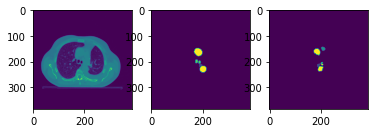

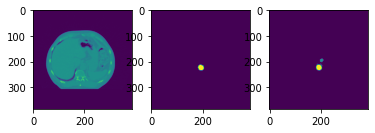

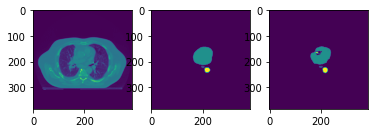

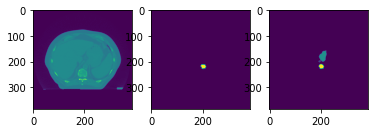

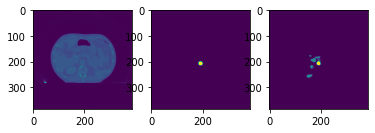

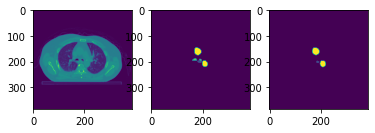

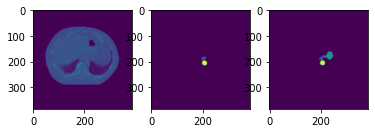

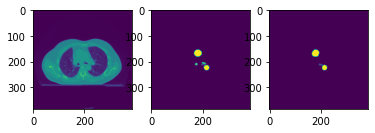

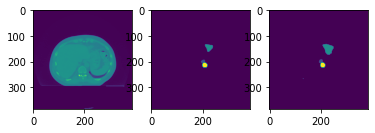

 10%|█         | 1/10 [11:25<1:42:45, 685.09s/it]

42 is running


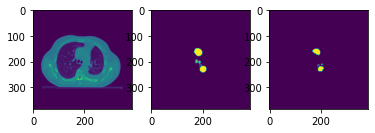

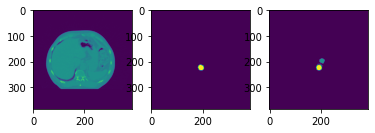

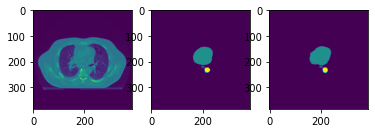

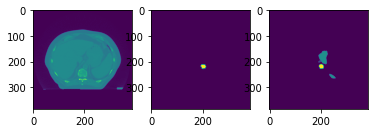

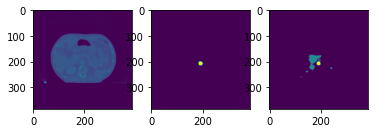

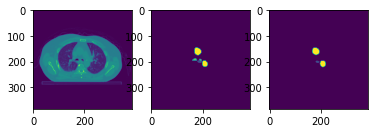

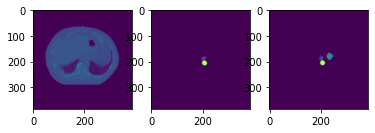

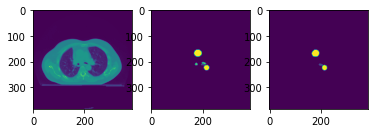

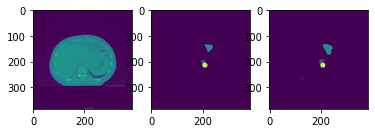

 20%|██        | 2/10 [22:50<1:31:22, 685.28s/it]

43 is running


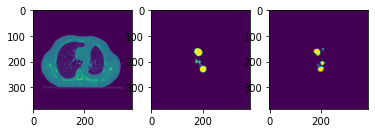

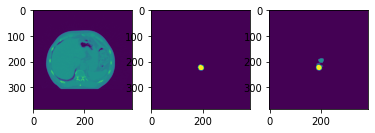

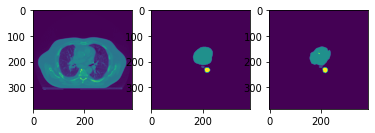

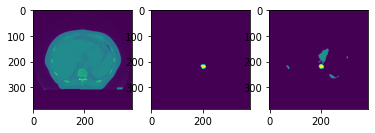

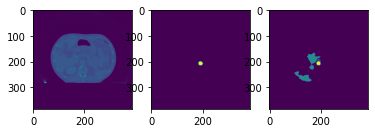

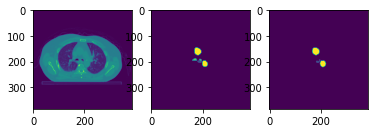

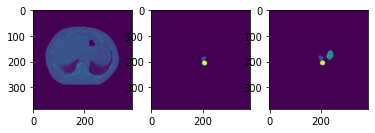

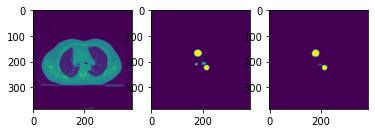

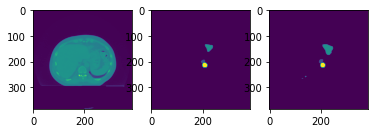

 30%|███       | 3/10 [34:14<1:19:52, 684.58s/it]

44 is running


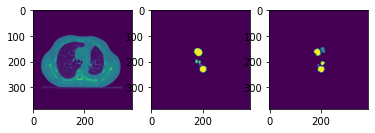

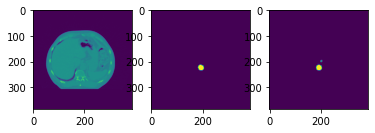

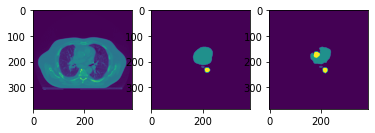

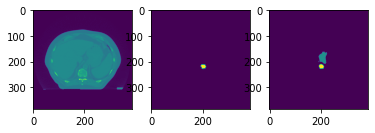

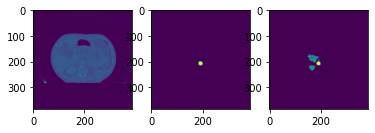

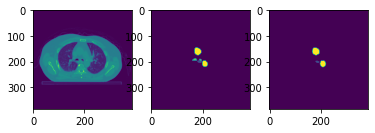

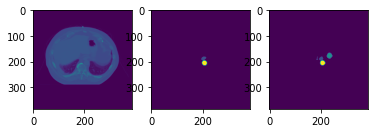

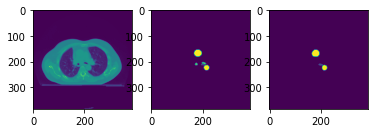

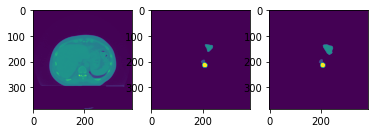

 40%|████      | 4/10 [45:38<1:08:27, 684.63s/it]

45 is running


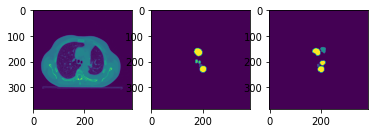

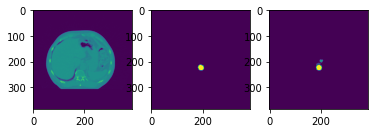

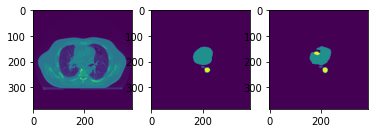

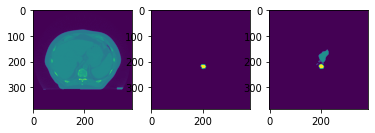

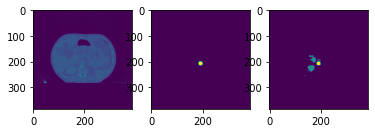

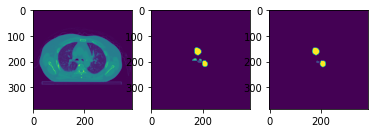

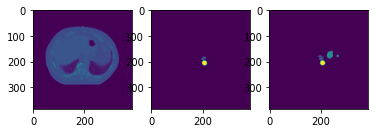

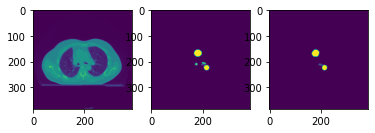

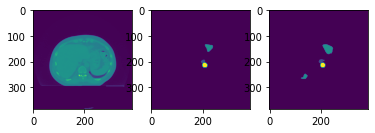

 50%|█████     | 5/10 [57:04<57:03, 684.78s/it]  

46 is running


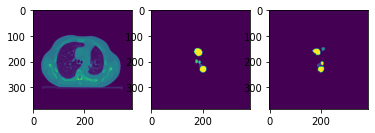

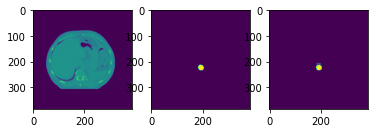

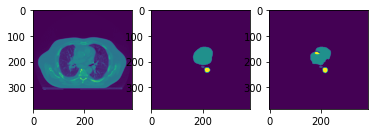

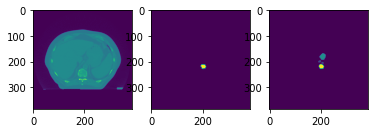

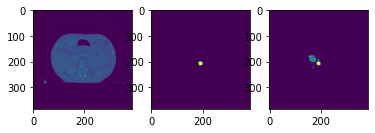

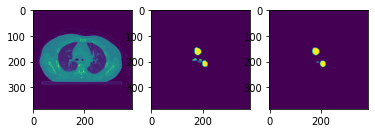

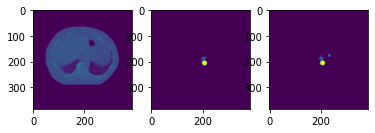

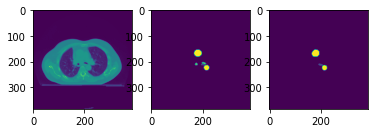

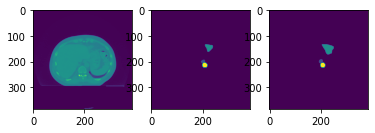

 60%|██████    | 6/10 [1:08:29<45:39, 684.87s/it]

47 is running


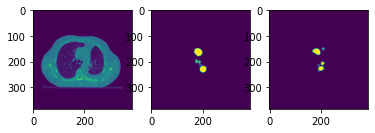

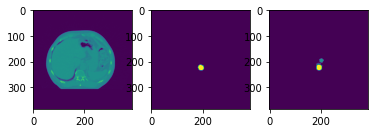

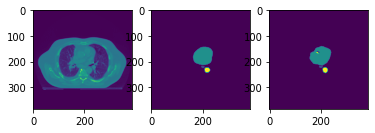

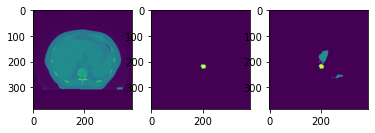

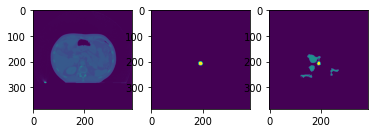

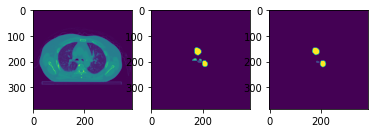

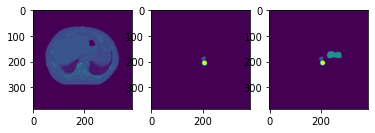

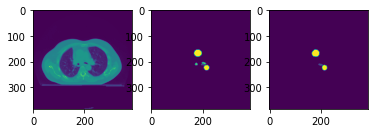

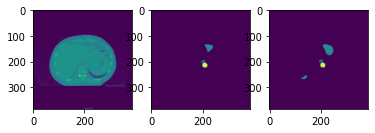

 70%|███████   | 7/10 [1:19:54<34:14, 684.94s/it]

48 is running


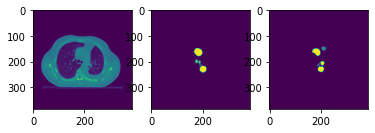

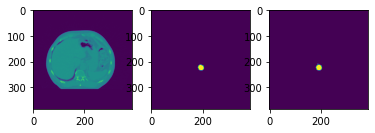

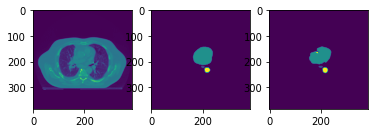

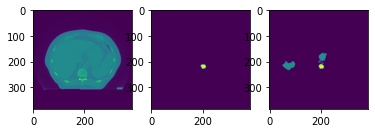

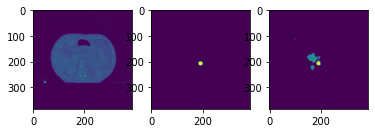

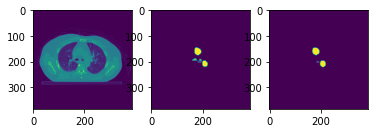

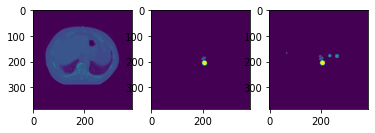

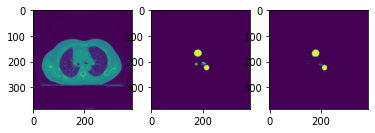

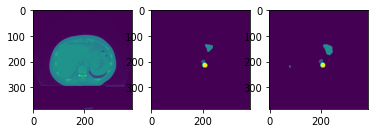

 80%|████████  | 8/10 [1:31:18<22:49, 684.71s/it]

49 is running


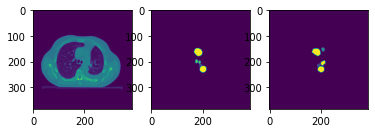

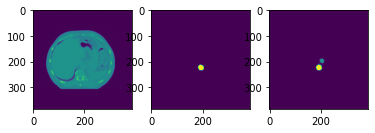

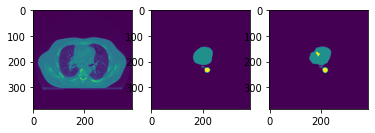

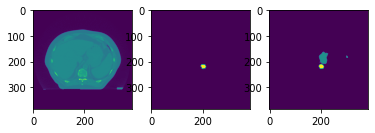

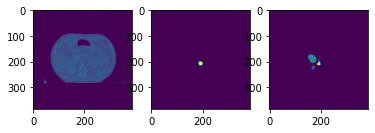

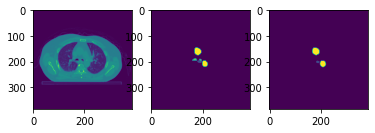

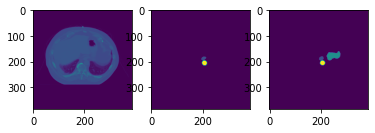

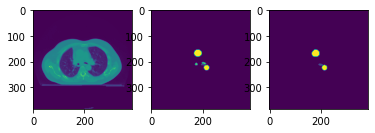

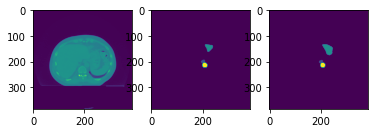

 90%|█████████ | 9/10 [1:42:43<11:24, 684.73s/it]

50 is running


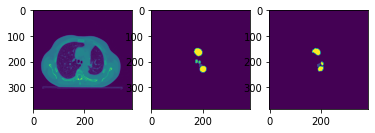

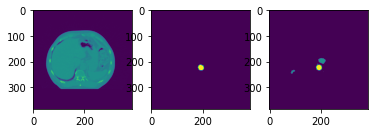

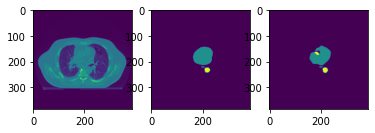

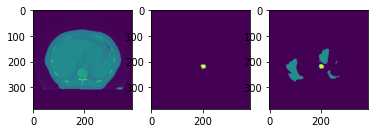

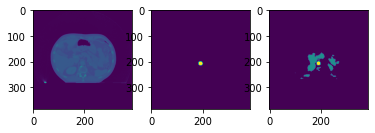

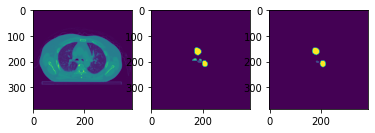

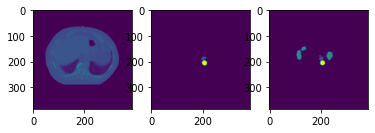

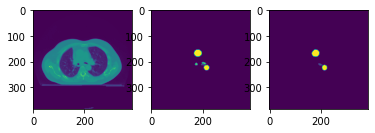

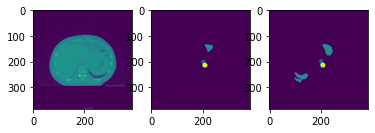

100%|██████████| 10/10 [1:54:08<00:00, 684.88s/it]


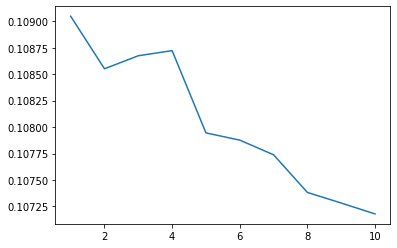

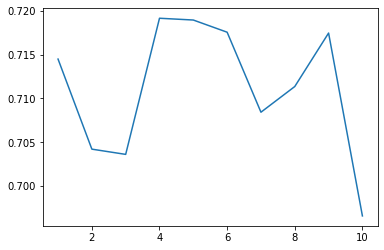

In [ ]:
%load_ext tensorboard
import torch.utils.tensorboard as tb
import tempfile
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from tqdm import tqdm
import matplotlib.pyplot as plt
from torch.nn.functional import one_hot
from pytorch_toolbelt import losses
from ignite.engine import *
from ignite.handlers import *
from ignite.metrics import *
import csv


def eval_step(engine, batch):
    return batch

default_evaluator = Engine(eval_step)

cm = ConfusionMatrix(num_classes=5)
metric = DiceCoefficient(cm)
metric.attach(default_evaluator, 'dice')

# max_slice_count = get_max_slice_count()

log_dir = tempfile.mkdtemp()
%tensorboard --logdir {log_dir} --reload_interval 1
writer = tb.SummaryWriter(log_dir, flush_secs=1)

device = torch.device("cpu" if not torch.cuda.is_available() else "cuda:0")

loader_train, loader_valid = data_loaders()
loaders = {"train": loader_train, "valid": loader_valid}

unet = UNet(in_channels=1, out_channels=5)
unet.to(device)
dice_val = DiceVal()
loss_function = losses.DiceLoss(mode = "multiclass")
best_validation_dsc = 0.0
optimizer = optim.Adam(unet.parameters(), lr=0.0001)
# loss_function = nn.CrossEntropyLoss()

loss_train_final = []
dice_valid_final = []
Valid_loss_final = []


epoch_num = 50

done_epoch = 0
prev_traning_data = get_prev_traning_data()
if prev_traning_data:
  print("hello")
  done_epoch = prev_traning_data['epoch']
  loss = prev_traning_data['loss']
  unet.load_state_dict(prev_traning_data['model_state_dict'])
  optimizer.load_state_dict(prev_traning_data['optimizer_state_dict'])
                       

for epoch in tqdm(range(done_epoch+1, epoch_num+1)):
  print("{epc} is running".format(epc = epoch))
  loss_train = []
  loss_valid = []
  Dice_valid = []
  Dice_per_organ = {}
  step = 0
  img_print = 0

  for phase in ["train", 'valid']:
    if phase == "train":
      validation_predict = {}
      validation_true = {}
      unet.train()
    else:
      unet.eval()

    for i, data in enumerate(loaders[phase]):
      x, y_true, patient_id , slice_id = data
      x, y_true = x.to(device), y_true.to(device)
      
      optimizer.zero_grad()

      with torch.set_grad_enabled(phase == "train"):
        y_pred = unet(x)
        loss = loss_function(y_pred, y_true)  


        if phase == "valid":
          loss = loss_function(y_pred, y_true)
          loss_valid.append(float(loss.item()))
          step = step + 1

          patient_id = int(patient_id)
          slice_id = int(slice_id)

          if patient_id not in validation_predict.keys():
            validation_predict[patient_id] = y_pred
            validation_true[patient_id] = y_true
          else:
            validation_predict[patient_id] = torch.cat((validation_predict[patient_id], y_pred))
            validation_true[patient_id] = torch.cat((validation_true[patient_id], y_true))

          if (img_print % 70) == 0:
            y_pred_np = y_pred.detach().cpu().numpy().squeeze()
            y_pred_np = np.argmax(y_pred_np, 0)
            y_true_np = y_true.detach().cpu().numpy().squeeze()
            main_image_np = x.detach().cpu().numpy().squeeze()
            plt.figure(img_print)
            plt.subplot(1, 3, 1)
            plt.imshow(main_image_np)
            plt.subplot(1, 3, 2)
            plt.imshow(y_true_np)
            plt.subplot(1, 3, 3)
            plt.imshow(y_pred_np)
            plt.show()
          img_print = img_print + 1

        if phase == "train":
          loss_train.append(float(loss.item()))
          loss.backward()
          optimizer.step()

  all_dice_per_organ = torch.zeros(1,5)
  for patient in validation_predict.keys():
    val_patient_pred = validation_predict[patient]
    val_patient_true = validation_true[patient]
    dice = 1 - loss_function(val_patient_pred, val_patient_true)
    Dice_valid.append(float(dice.item()))

    dice_per_organ = default_evaluator.run([[val_patient_pred, val_patient_true]])
    dice_per_organ = dice_per_organ.metrics['dice']
    dice_per_organ = dice_per_organ[None, :]
    all_dice_per_organ = torch.cat((all_dice_per_organ, dice_per_organ), 0)

  avg_all_dice_per_organ = torch.mean(all_dice_per_organ[1:],0)

  t_loss = np.mean(np.array(loss_train))
  v_loss = np.mean(np.array(loss_valid))
  V_dice = np.mean(np.array(Dice_valid))

  with open("/content/drive/MyDrive/dataset/Output/data_dice.csv", 'a') as f:
    csv_writer = csv.writer(f, delimiter=',')
    csv_writer.writerow([epoch, t_loss, v_loss, V_dice, avg_all_dice_per_organ[0].item(), avg_all_dice_per_organ[1].item(), avg_all_dice_per_organ[2].item(), avg_all_dice_per_organ[3].item(), avg_all_dice_per_organ[4].item()])

  loss_train_final.append(t_loss)
  writer.add_scalar("train Loss", t_loss, epoch)
  dice_valid_final.append(V_dice)
  writer.add_scalar("validation Dice", V_dice, epoch)
  Valid_loss_final.append(v_loss)
  writer.add_scalar("validation loss", v_loss, epoch)
  
  for i in range(5):
    writer.add_scalar("Organ Dice/{organ}".format(organ=i), float(avg_all_dice_per_organ[i].item()), epoch)
    
  # check_file = "/content/drive/MyDrive/Research/Image_segmentation/checkpoint/seg_{ep}_{dic}.pt".format(ep=epoch, dic = V_dice)
  check_file = "/content/drive/MyDrive/dataset/Output/checkpoint/seg_{ep}_{dic}.pt".format(ep=epoch, dic = V_dice)
  torch.save({
            'epoch': epoch,
            'model_state_dict': unet.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': loss,
            't_loss': t_loss,
            'v_loss': v_loss,
            'V_dice': V_dice,
            'dice_01': avg_all_dice_per_organ
            }, check_file)

writer.flush()

trl = [i for i in range(1,len(loss_train_final)+1)]
plt.figure("test loss")
plt.plot(trl, loss_train_final)
plt.show()

vpl = [i for i in range(1,len(dice_valid_final)+1)]
plt.figure("Valid Dice")
plt.plot(vpl, dice_valid_final)
plt.show()


In [ ]:
# import numpy as np
# import glob
# files = glob.glob("/content/drive/MyDrive/dataset/Output/*.npy")
# for file in files:
#   pred = np.load(file)
#   pred_mask = np.argmax(pred, 0)
#   print(pred_mask.shape)
#   unique, counts = np.unique(pred_mask, return_counts=True)
#   print(np.asarray((unique, counts)).T)

In [ ]:
pip install pytorch-ignite

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# import torch
# from ignite.engine import *
# from ignite.handlers import *
# from ignite.metrics import *

# v = torch.zeros(5)
# print(v)
# def eval_step(engine, batch):
#     return batch

# default_evaluator = Engine(eval_step)

# cm = ConfusionMatrix(num_classes=5)
# metric = DiceCoefficient(cm)
# metric.attach(default_evaluator, 'dice')
# y_true1 = torch.randint(0, 5, (1, 10, 10))
# y_pred1 = torch.randint(0, 2, (1, 5, 10, 10))

# y_true2 = torch.randint(0, 5, (1, 10, 10))
# y_pred2 = torch.randint(0, 2, (1, 5, 10, 10))

# state1 = default_evaluator.run([[y_pred1, y_true1]])
# print(state1.metrics['dice'])

# state2 = default_evaluator.run([[y_pred2, y_true2]])
# print(state2.metrics['dice'])

# y_true3 = torch.cat((y_true1, y_true2))
# y_pred3 = torch.stack((y_pred1.squeeze(), y_pred2.squeeze()))

# x = torch.randint(0, 5, (1, 10, 10))
# y_true4 = torch.cat((y_true3, x))
# print(y_true4.shape)

# print(y_true3.shape)
# print(y_pred3.shape)

# state3 = default_evaluator.run([[y_pred3, y_true3]])
# x = state3.metrics['dice']
# x = x[None,:]
# emp = torch.zeros(1,5)
# for i in range(3):
#   emp = torch.cat((emp, x), 0)

# print(emp)
# print(torch.mean(emp,0))
# print(torch.mean(emp[1:],0))



In [ ]:
# import torch
# import torch.nn as nn

# input = torch.rand(1, 5, 10,10)
# target = torch.empty(1, 10, 10, dtype = torch.long).random_(5)
# print(target)

# loss = nn.CrossEntropyLoss()
# output = loss(input, target)
# print(input.shape)
# print(target.shape)
# print('input:\n ', input)
# print('target:\n ', target)
# print('Cross Entropy Loss: \n', output)

In [ ]:
import torch

model_save_name = 'seg_t35_t5_v3.pt'
# path = F"/content/drive/MyDrive/Research/Image_segmentation/{model_save_name}"
path = F"/content/drive/MyDrive/dataset/Output/{model_save_name}" 
torch.save(unet.state_dict(), path)

reading train images...
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 1, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 2, 30, 31, 32, 33, 34, 35, 3, 4, 5, 6, 7, 8, 9]
reading validation images...
[36, 37, 38, 39, 40]


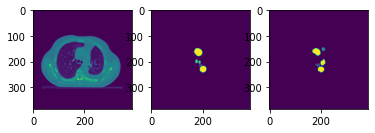

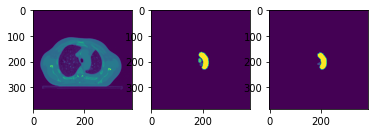

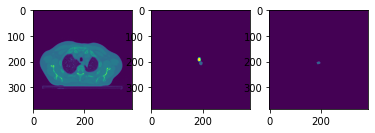

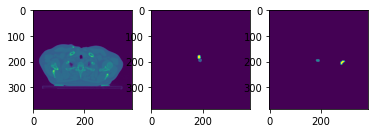

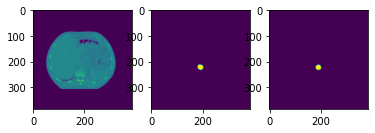

...

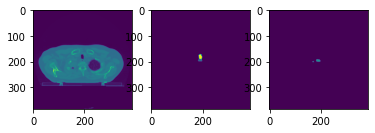

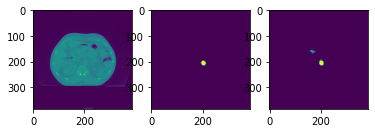

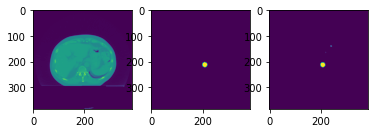

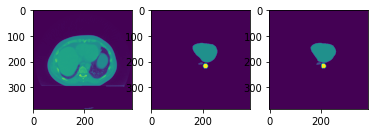

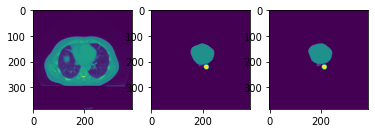

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt

model_save_name = 'seg_t35_t5_v3.pt'
# path = F"/content/drive/MyDrive/Research/Image_segmentation/{model_save_name}"
path = F"/content/drive/MyDrive/dataset/Output/{model_save_name}"
x = torch.load(path)
unet.load_state_dict(x)



img_p = 0

loader_train, loader_valid = data_loaders()
loaders = {"train": loader_train, "valid": loader_valid}

for i, data in enumerate(loaders["valid"]):
      x, y_true, patient_id , slice_id = data
      x, y_true = x.to(device), y_true.to(device)

      unet.eval()

      y_pred = unet(x)

      if (img_p % 15) == 0 :
        y_pred_np = y_pred.detach().cpu().numpy().squeeze()
        y_pred_np = np.argmax(y_pred_np, 0)
        y_true_np = y_true.detach().cpu().numpy().squeeze()
        main_image_np = x.detach().cpu().numpy().squeeze()
        plt.figure(img_print)
        plt.subplot(1, 3, 1)
        plt.imshow(main_image_np)
        plt.subplot(1, 3, 2)
        plt.imshow(y_true_np)
        plt.subplot(1, 3, 3)
        plt.imshow(y_pred_np)
        plt.show()
      img_p = img_p + 1


# print(unet.load_state_dict(torch.load(path)))

In [ ]:
import csv
# f = open('/content/drive/MyDrive/dataset/Output/test.csv', 'a')

with open("/content/drive/MyDrive/dataset/Output/test.csv", 'a') as f:
  csv_writer = csv.writer(f, delimiter=',')
  for i in range (4, 10):
    csv_writer.writerow([i, i+1, i+2, i + 3])


In [ ]:
def abc(x):
  if x == 1:
    return "x"
  if x == 0:
    return 0

val = abc(0)

if val:
  print("True")
else:
  print("Not working")


Not working


In [ ]:
from tqdm import tqdm
for i in tqdm(range(100,10000)):
  x = 2

100%|██████████| 9900/9900 [00:00<00:00, 1581128.99it/s]
